In [423]:
#Import dependencies
import numpy as np 
import matplotlib.pyplot as plt 
import pandas as pd
import seaborn as sns
import plotly
import plotly.express as px
import scipy.stats as st
from scipy.stats import linregress

#Upload CSV
home_path = "Resources/home_cleaned_data.csv"
regions_path = "Resources/regions.csv"

#Read data and results
home_df = pd.read_csv(home_path)
regions_df = pd.read_csv(regions_path)

home_df

,State,Zipcode,Latitude,Longitude,Bedroom,Bathroom,Area,ConvertedLot,MarketEstimate,Price
0,AL,36571,30.819534,-88.095960,4,2.0,1614,0.38050,240600,239900
1,AL,35907,33.881050,-86.012436,3,2.0,1474,0.67034,186700,1
2,AL,35043,33.357986,-86.608700,3,3.0,2224,0.26000,336200,335000
3,AL,36117,32.372746,-86.165115,3,2.0,1564,0.20000,150500,151000
4,AL,35957,34.210014,-86.136690,3,2.0,1717,0.38000,238400,239000
...,...,...,...,...,...,...,...,...,...,...
15023,WY,82633,42.756350,-105.399580,3,3.0,2316,0.15000,306700,310000
15024,WY,82501,43.077744,-108.558960,3,3.0,2400,3.35000,184500,185000
15025,WY,82053,41.149517,-104.439620,2,1.0,1112,20.00000,368600,375000
15026,WY,82009,41.138450,-105.052790,3,2.0,2930,6.23000,558000,575900


In [424]:
#Filter by bedrooms
zero_bed_df = home_df.loc[home_df["Bedroom"]==0]
one_bed_df = home_df.loc[home_df["Bedroom"]==1]
two_bed_df = home_df.loc[home_df["Bedroom"]==2]
three_bed_df = home_df.loc[home_df["Bedroom"]==3]
four_bed_df = home_df.loc[home_df["Bedroom"]==4]

#Group by State
zero_bed_state = zero_bed_df.groupby("State").median()
one_bed_state = one_bed_df.groupby("State").median()
two_bed_state = two_bed_df.groupby("State").median()
three_bed_state = three_bed_df.groupby("State").median()
four_bed_state = four_bed_df.groupby("State").median()

#Reset Index
zero_bed_state = zero_bed_state.reset_index()
one_bed_state = one_bed_state.reset_index()
two_bed_state = two_bed_state.reset_index()
three_bed_state = three_bed_state.reset_index()
four_bed_state = four_bed_state.reset_index()

zero_bed_state

,State,Zipcode,Latitude,Longitude,Bedroom,Bathroom,Area,ConvertedLot,MarketEstimate,Price
0,AK,99677.5,61.386823,-150.481465,0.0,0.0,433.0,3.060000,119550.0,124950.0
1,AZ,85625.0,31.856321,-109.562450,0.0,1.0,1073.0,39.270000,467500.0,398500.0
2,CO,80536.0,40.993713,-105.440315,0.0,0.0,0.0,37.000000,1654900.0,1650000.0
3,IA,50309.0,41.581150,-93.602510,0.0,0.0,1420.0,0.227000,77600.0,80000.0
4,MD,21222.5,39.294060,-76.672175,0.0,0.0,1180.5,0.031713,75200.0,45000.0
5,ME,4024.0,43.844776,-70.673030,0.0,2.0,3038.0,0.250000,118100.0,109900.0
6,MN,55436.0,44.894127,-93.394520,0.0,1.0,554.0,8.900000,117800.0,115000.0
7,MS,39525.0,30.389992,-89.358665,0.0,1.0,471.0,0.010000,75800.0,78500.0
8,MT,59068.0,45.260952,-109.226480,0.0,2.0,620.0,4.017000,433300.0,449900.0
9,ND,58621.0,46.913760,-104.001920,0.0,2.0,3314.0,0.290000,69900.0,63000.0


# Bar Graphs


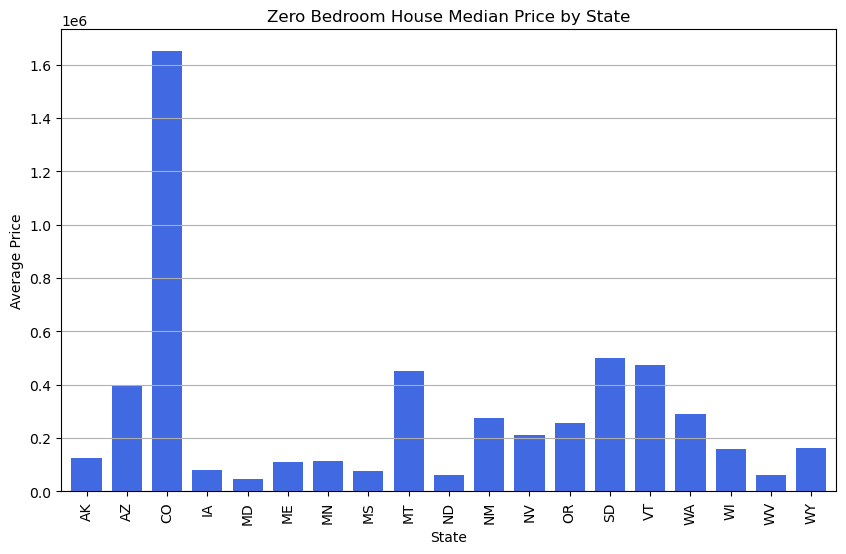

In [426]:
#Bar Graph for 0 bedroom
zero_bed_plot = zero_bed_state.plot(kind="bar", x="State", y="Price", width = 0.75, figsize=(10,6), color="royalblue", legend = False)
plt.grid(axis="y")
plt.title("Zero Bedroom House Median Price by State")
plt.xlabel("State")
plt.ylabel("Average Price")
plt.savefig("0bedroom.jpg")
plt.show()

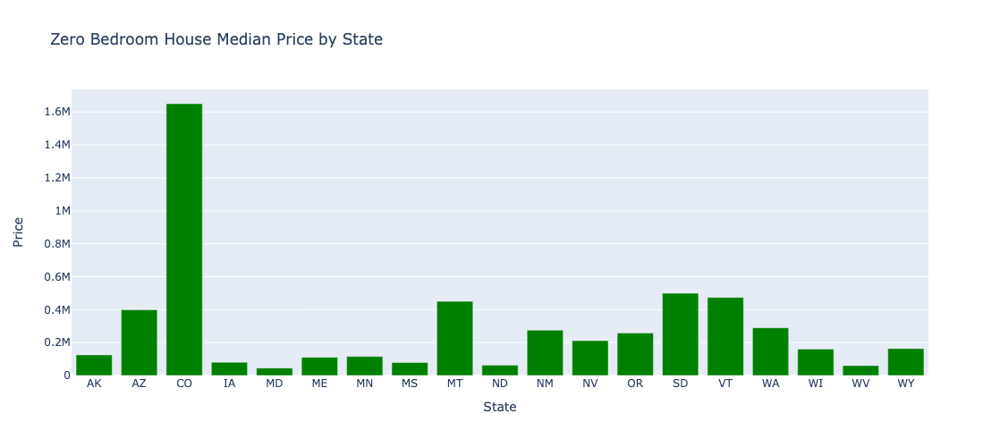

In [491]:
#PLotly
fig = px.bar(zero_bed_state, x='State', y='Price', title = "Zero Bedroom House Median Price by State", width = 900, height = 500)
fig.update_traces(marker_color="green")
fig.write_image("Graphs/zerobdrmstate.png")
fig.show()

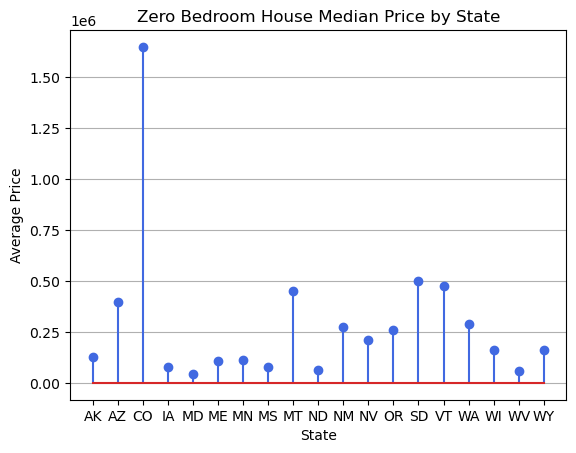

In [427]:
#Stem Plot
plt.stem(zero_bed_state['State'], zero_bed_state['Price'], 'royalblue')
plt.title('Zero Bedroom House Median Price by State')
plt.xlabel("State")
plt.ylabel("Average Price")
plt.grid(axis="y")
plt.show()

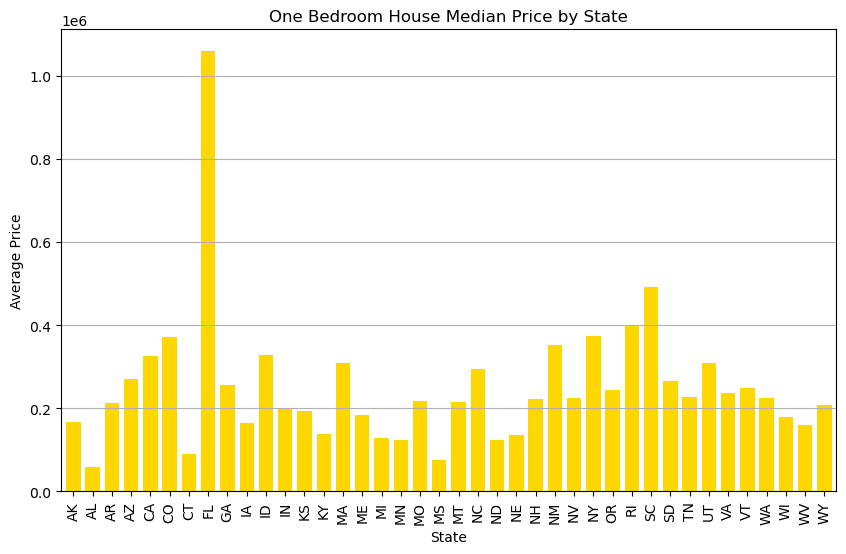

In [428]:
#Bar Graph for 1 bedroom
one_bed_plot = one_bed_state.plot(kind="bar", x="State", y="Price", width = 0.75, figsize=(10,6), color="gold", legend = False)
plt.grid(axis="y")
plt.title("One Bedroom House Median Price by State")
plt.xlabel("State")
plt.ylabel("Average Price")
plt.savefig("1bedroom.jpg")
plt.show()

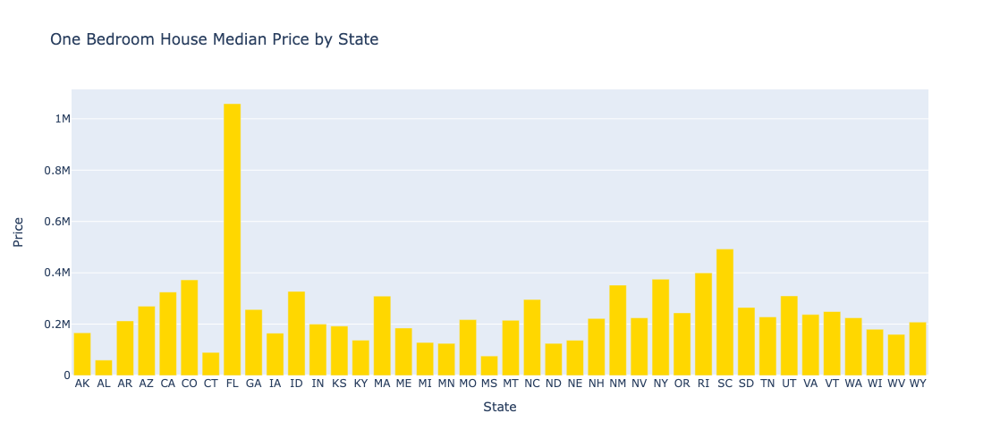

In [493]:
#PLotly
fig = px.bar(one_bed_state, x='State', y='Price', width = 900, height = 500, title = "One Bedroom House Median Price by State")
fig.update_traces(marker_color="gold")
fig.write_image("Graphs/onebdrmstate.png")
fig.show()

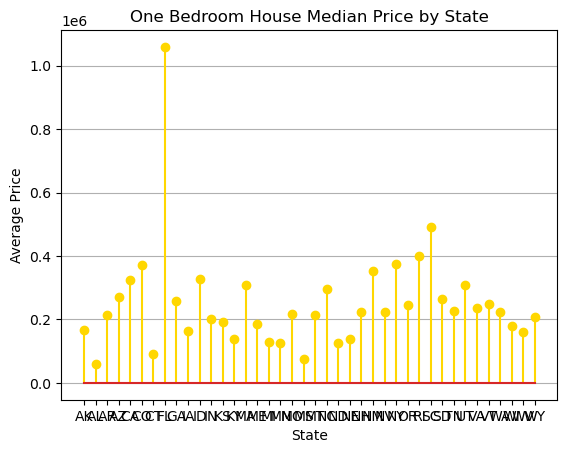

In [429]:
#Stem Plot

from matplotlib.pyplot import figure


plt.stem(one_bed_state['State'], one_bed_state['Price'], 'gold')
plt.figsize=(30,15)
plt.title('One Bedroom House Median Price by State')
plt.xlabel("State")
plt.ylabel("Average Price")
plt.grid(axis="y")

plt.show()

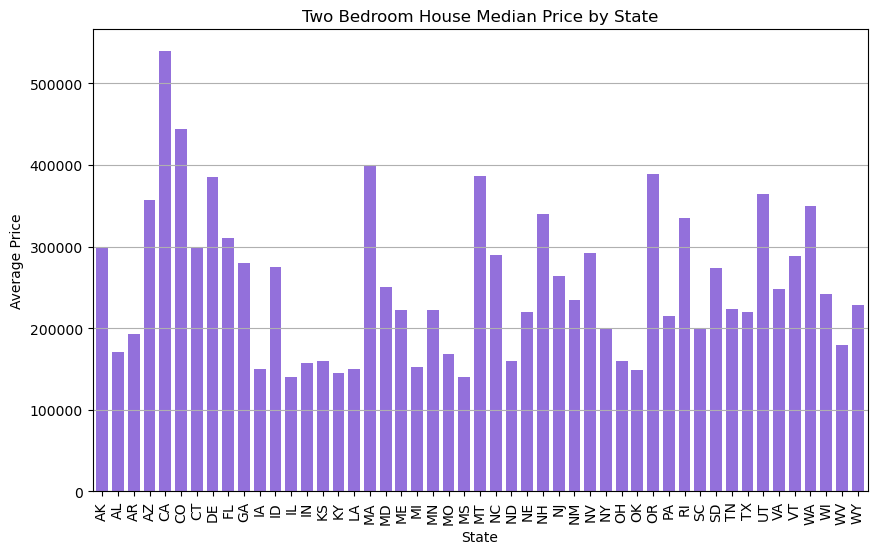

In [430]:
#Bar Graph for 2 bedrooms
two_bed_plot = two_bed_state.plot(kind="bar", x="State", y="Price", width = 0.75, figsize=(10,6), color="mediumpurple", legend = False)
plt.grid(axis="y")
plt.title("Two Bedroom House Median Price by State")
plt.xlabel("State")
plt.ylabel("Average Price")
plt.savefig("2bedroom.jpg")
plt.show()

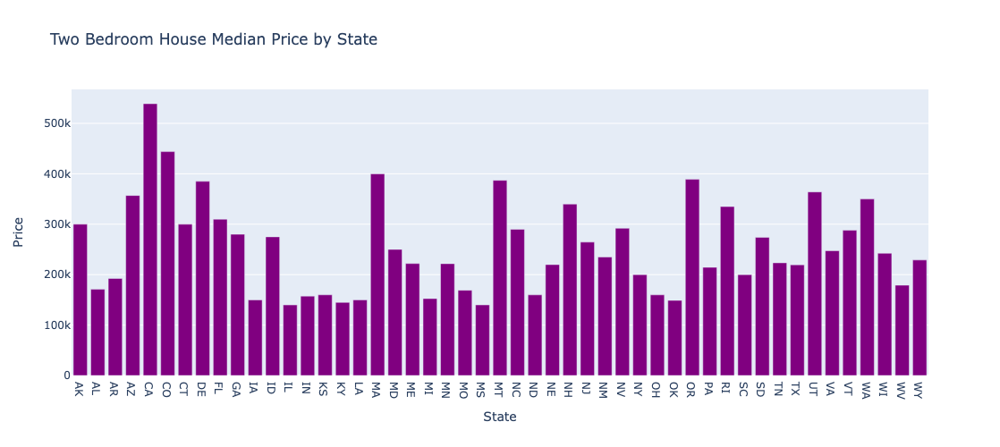

In [495]:
#PLotly
fig = px.bar(two_bed_state, x='State', y='Price', width = 900, height = 500, title = "Two Bedroom House Median Price by State")
fig.update_traces(marker_color="purple")
fig.write_image("Graphs/twobdrmstate.png")
fig.show()

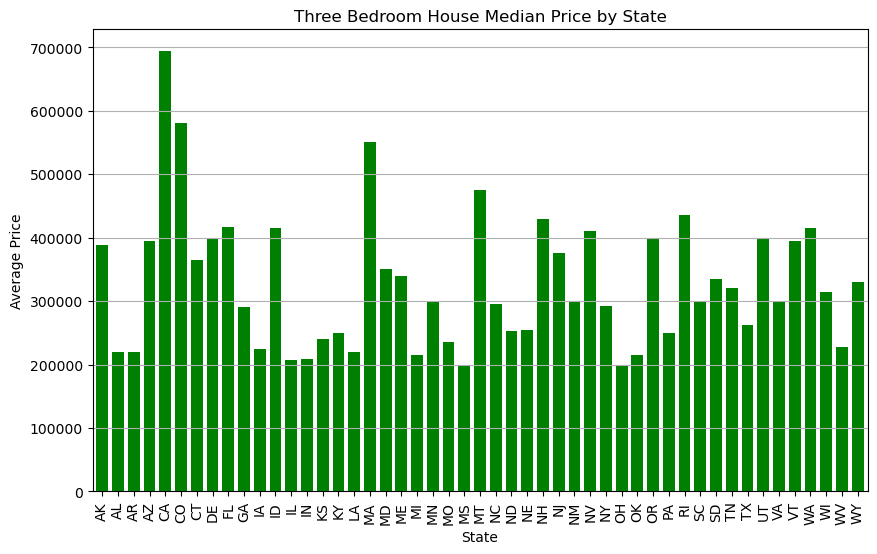

In [431]:
#Bar Graph for 3 bedrooms
three_bed_plot = three_bed_state.plot(kind="bar", x="State", y="Price", width = 0.75, figsize=(10,6), color="green", legend = False)
plt.grid(axis="y")
plt.title("Three Bedroom House Median Price by State")
plt.xlabel("State")
plt.ylabel("Average Price")
plt.savefig("3bedroom.jpg")
plt.show()

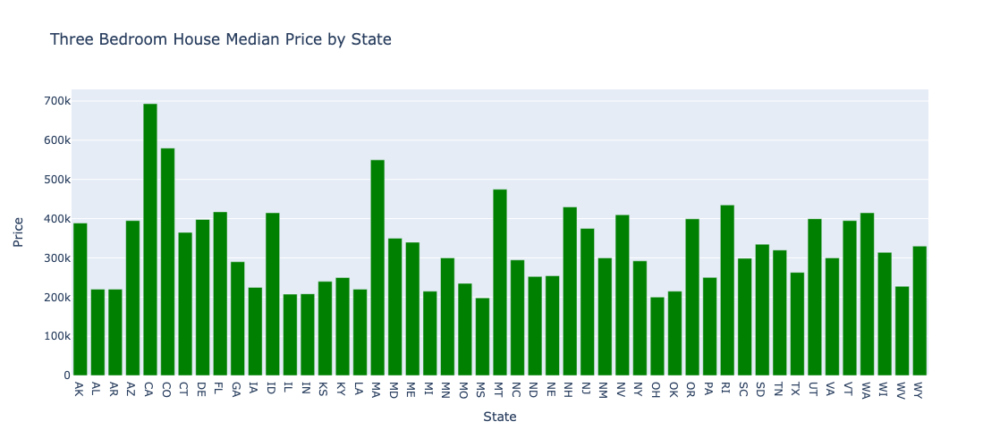

In [497]:
fig = px.bar(three_bed_state, x='State', y='Price', width = 900, height = 500, title = "Three Bedroom House Median Price by State")
fig.update_traces(marker_color="green")
fig.write_image("Graphs/threebdrmstate.png")
fig.show()

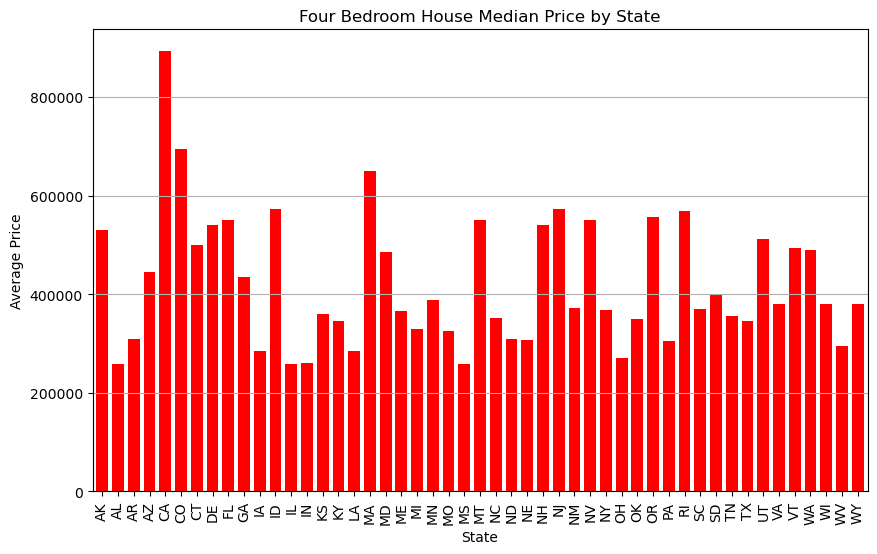

In [432]:
#Bar Graph for 4 bedrooms
four_bed_plot = four_bed_state.plot(kind="bar", x="State", y="Price", width = 0.75, figsize=(10,6), color="red", legend = False)
plt.grid(axis="y")
plt.title("Four Bedroom House Median Price by State")
plt.xlabel("State")
plt.ylabel("Average Price")
plt.savefig("4bedroom.jpg")
plt.show()

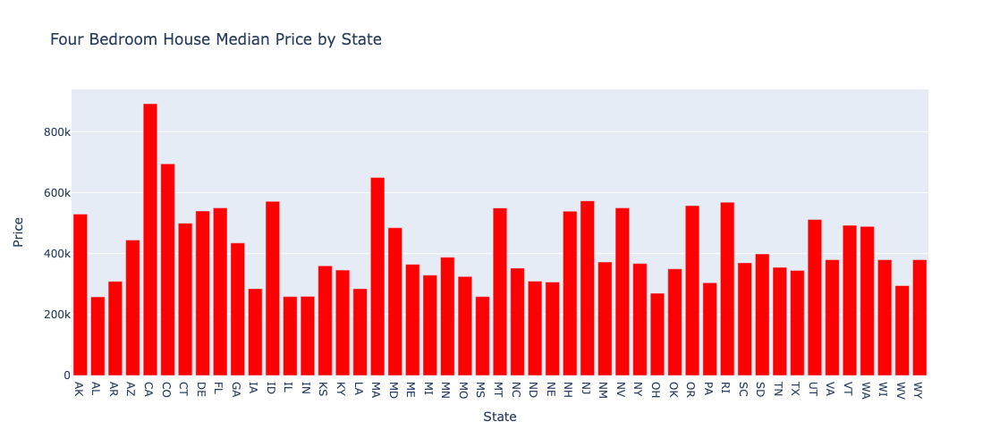

In [498]:
#Plotly
fig = px.bar(four_bed_state, x='State', y='Price', width = 900, height = 500, title = "Four Bedroom House Median Price by State")
fig.update_traces(marker_color="red")
fig.write_image("Graphs/fourbdrmstate.png")
fig.show()

# Heatmaps

In [434]:
#Group by State and Bedrooms
grouped_home_df = home_df.groupby(["State", "Bedroom"])

#Find Average Prices
averages_df = grouped_home_df["Price"].median()

#Make Data Frame and Reset Index
averages_df = pd.DataFrame(averages_df)
averages_df = averages_df.reset_index()

#Change to Integers
averages_df["Price"] = averages_df["Price"].astype("int64")

#Locate to 4 bedrooms or below
averages_four_df = averages_df.loc[(averages_df["Bedroom"]<5)&(averages_df["Bedroom"]>1)]
averages_three_four_df = averages_df.loc[(averages_df["Bedroom"]<5)&(averages_df["Bedroom"]>1)]
averages_top_six_df = averages_four_df.loc[(averages_four_df["State"]=="AL")|(averages_four_df["State"]=="CA") | \
                                            (averages_four_df["State"]=="MO") | (averages_four_df["State"]=="MT") | \
                                            (averages_four_df["State"]=="OH") | (averages_four_df["State"]=="RI") | \
                                            (averages_four_df["State"]=="VT") | (averages_four_df["State"]=="WV") | \
                                            (averages_four_df["State"]=="WY")]

In [435]:

averages_df

,State,Bedroom,Price
0,AK,0,124950
1,AK,1,166250
2,AK,2,300000
3,AK,3,389000
4,AK,4,530000
...,...,...,...
366,WY,6,451950
367,WY,7,1495000
368,WY,8,396000
369,WY,10,245000


In [436]:
averages_matrix = averages_top_six_df.pivot_table(index="State", columns="Bedroom", values="Price")
homes_matrix = averages_three_four_df.pivot_table(index="State", columns="Bedroom", values="Price")

In [437]:
homes_matrix

Bedroom,2,3,4
State,,,
AK,300000.0,389000.0,530000.0
AL,170950.0,219950.0,258000.0
AR,192400.0,219950.0,309000.0
AZ,357000.0,395000.0,445000.0
CA,539000.0,693250.0,892250.0
CO,443947.0,580000.0,695000.0
CT,299900.0,365000.0,499900.0
DE,384990.0,398000.0,539999.0
FL,310000.0,417450.0,550000.0


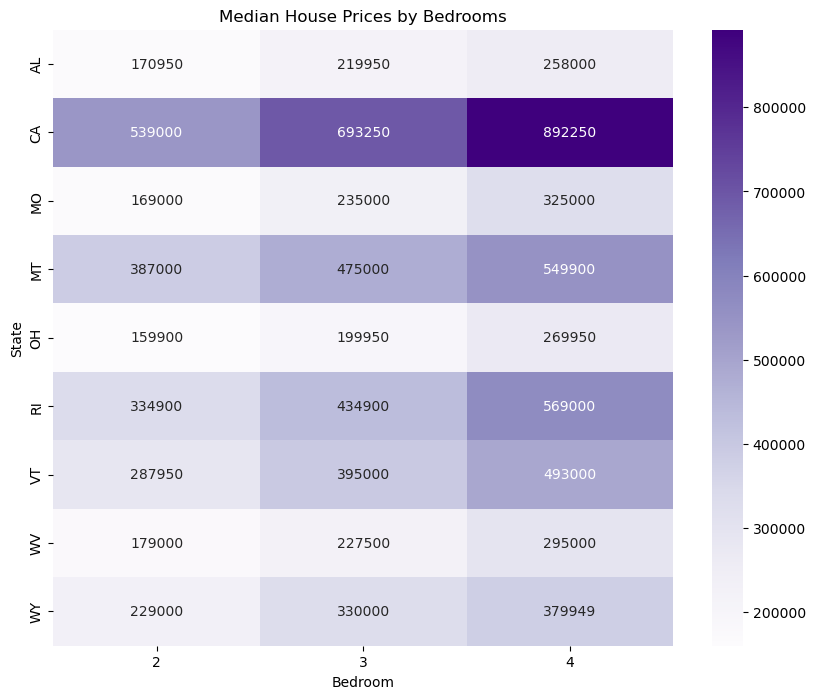

In [438]:
#Heatmap certain states by bedroom
plt.figure(figsize=(10,8))
heatmap = sns.heatmap(averages_matrix, cmap="Purples", annot=True, fmt="0.0f", annot_kws={"size":10})
plt.title("Median House Prices by Bedrooms")
plt.savefig("Graphs/medianheatmap10.png")
plt.show()

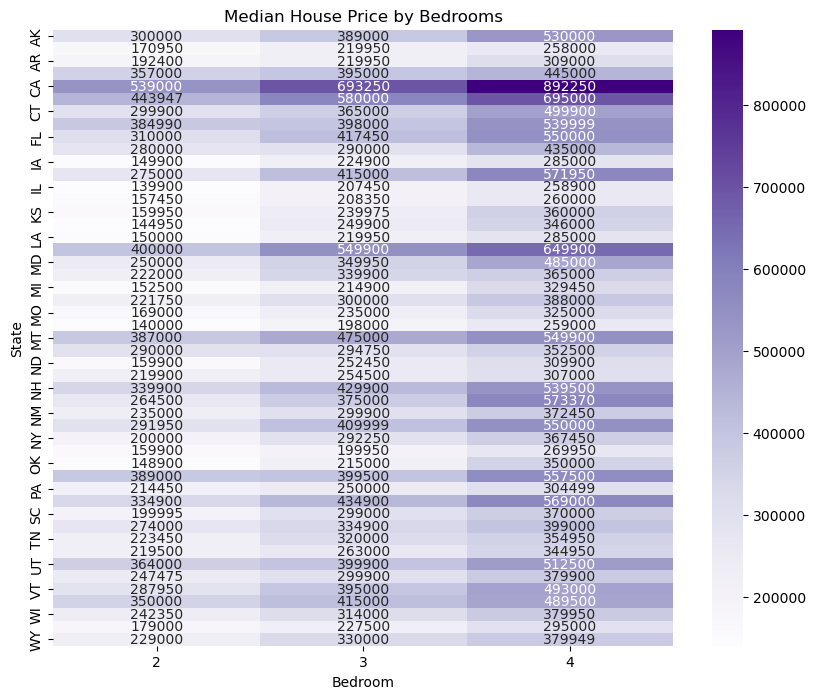

In [439]:
#Heatmap all states by bedroom
plt.figure(figsize=(10,8))
heatmap = sns.heatmap(homes_matrix, cmap="Purples", annot=True, fmt="0.0f", annot_kws={"size":10})
plt.title("Median House Price by Bedrooms")
plt.savefig("Graphs/medianheatmapall.png")
plt.show()

In [509]:
#Group by State and Area
grouped_area_df = home_df.groupby(["State", "Bedroom"])

#Find Average Prices
area_averages_df = grouped_area_df["Area"].median()

#Make Data Frame and Reset Index
area_averages_df = pd.DataFrame(area_averages_df)
area_averages_df = area_averages_df.reset_index()

#Change to Integers
#area_averages_df["Area"] = averages_df["Area"].astype("int64")

area_averages_located_df = area_averages_df.loc[(area_averages_df["Bedroom"]<5)&(area_averages_df["Bedroom"]>1)]

#By State
area_averages_top_six_df = area_averages_located_df.loc[(area_averages_located_df["State"]=="AL")|(area_averages_located_df["State"]=="CA") | \
                                            (area_averages_located_df["State"]=="MO") | (area_averages_located_df["State"]=="MT") | \
                                            (area_averages_located_df["State"]=="OH") | (area_averages_located_df["State"]=="RI") | \
                                            (area_averages_located_df["State"]=="VT") | (area_averages_located_df["State"]=="WV") | \
                                            (area_averages_located_df["State"]=="WY")]

#Create Matrix
area_averages_matrix = area_averages_located_df.pivot_table(index="State", columns="Bedroom", values="Area")
area_six_averages_matrix = area_averages_top_six_df.pivot_table(index="State", columns="Bedroom", values="Area")
area_six_averages_matrix

Bedroom,2,3,4
State,,,
AL,1234.0,1551.5,2213.0
CA,1132.0,1584.0,2140.0
MO,1056.0,1620.0,2207.0
MT,1240.0,1664.0,2549.0
OH,1141.0,1529.0,2104.5
RI,1204.0,1670.0,2145.0
VT,1213.5,1874.0,2462.0
WV,1288.0,1608.0,2259.0
WY,1256.0,1800.0,2380.0


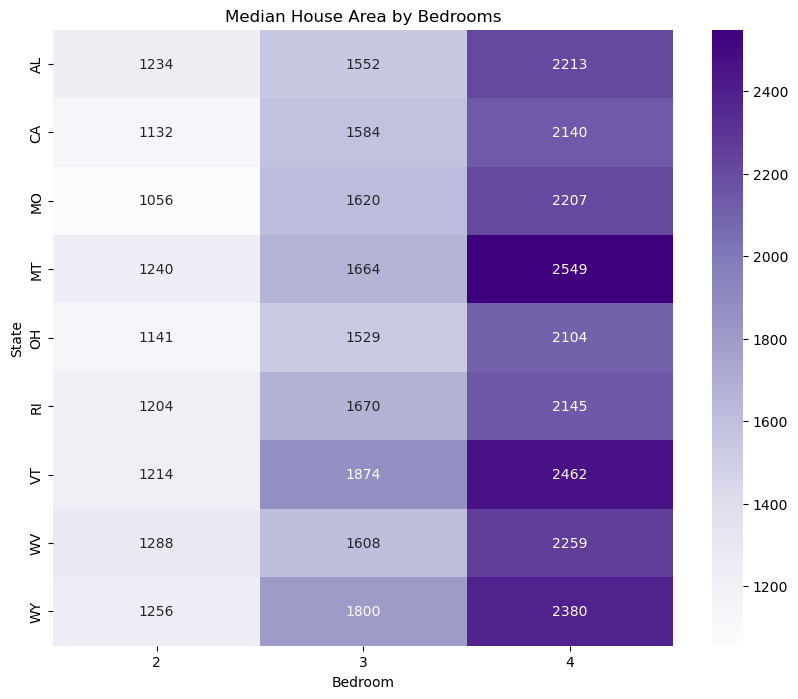

In [510]:
#Heatmap certain states area
plt.figure(figsize=(10,8))
heatmap = sns.heatmap(area_six_averages_matrix, cmap="Purples", annot=True, fmt="0.0f", annot_kws={"size":10})
plt.title("Median House Area by Bedrooms")
plt.savefig("Graphs/medianheatmaparea10.png")
plt.show()

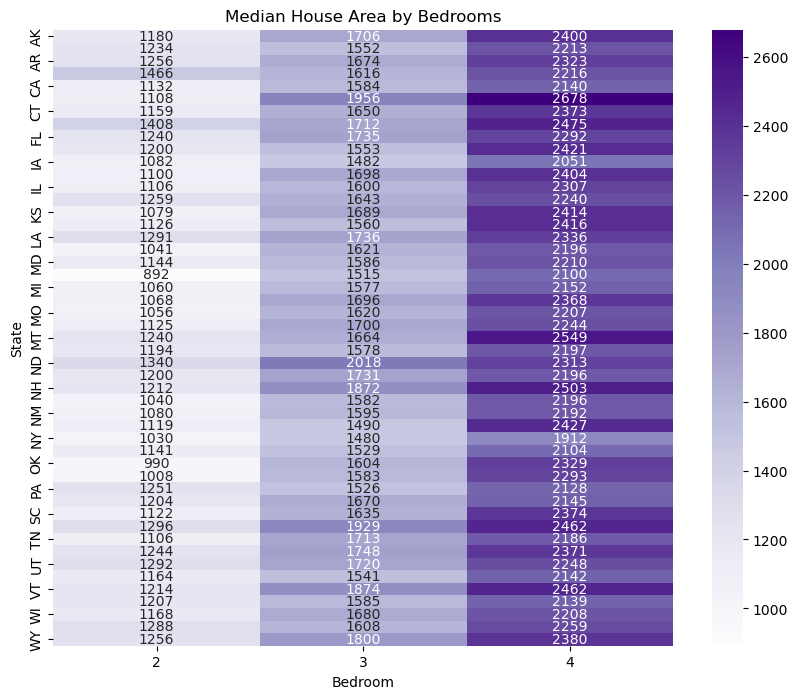

In [504]:
#Heatmap all states area
plt.figure(figsize=(10,8))
heatmap = sns.heatmap(area_averages_matrix, cmap="Purples", annot=True, fmt="0.0f", annot_kws={"size":10})
plt.title("Median House Area by Bedrooms")
plt.savefig("Graphs/medianheatmapareaall.png")
plt.show()

# Plotly Scatter Plots

In [440]:
#Create Data Frame
home_df.columns
#Reduce Data Frame
home_reduced_df = home_df[["State", "Bedroom", "Bathroom", "Area", "MarketEstimate", "Price"]]

#Convert bathroom to integer
home_reduced_df = home_reduced_df.astype({"Bathroom": "int64"})

In [441]:
#Group by State and Bedrooms
home_filtered_df = home_reduced_df.groupby(["State", "Bedroom", "Bathroom"])

#Find Average Prices
home_averages_df = home_filtered_df["Price"].mean()

#Make Data Frame and Reset Index
home_averages_df = pd.DataFrame(home_averages_df)
home_averages_df = home_averages_df.reset_index()

#Change to Integers
home_averages_df["Price"] = home_averages_df["Price"].astype("int64")

#Locate to 4 bedrooms or below
averages_four_df = home_averages_df.loc[(home_averages_df["Bedroom"]<5)&(home_averages_df["Bedroom"]>1)]
averages_three_four_df = home_averages_df.loc[(home_averages_df["Bedroom"]<5)&(home_averages_df["Bedroom"]>2)]
# averages_top_six_df = averages_four_df.loc[(averages_four_df["State"]=="AL")|(averages_four_df["State"]=="CA") | \
#                                             (averages_four_df["State"]=="MO") | (averages_four_df["State"]=="MT") | \
#                                             (averages_four_df["State"]=="OH") | (averages_four_df["State"]=="RI") | \
#                                             (averages_four_df["State"]=="VT") | (averages_four_df["State"]=="WV") | \
#                                             (averages_four_df["State"]=="WY")]

averages_top_six_df = averages_four_df.loc[(averages_four_df["State"]=="AL")| \
                                            (averages_four_df["State"]=="MO") | \
                                            (averages_four_df["State"]=="MS") | (averages_four_df["State"]=="OH") | \
                                            (averages_four_df["State"]=="WV")]

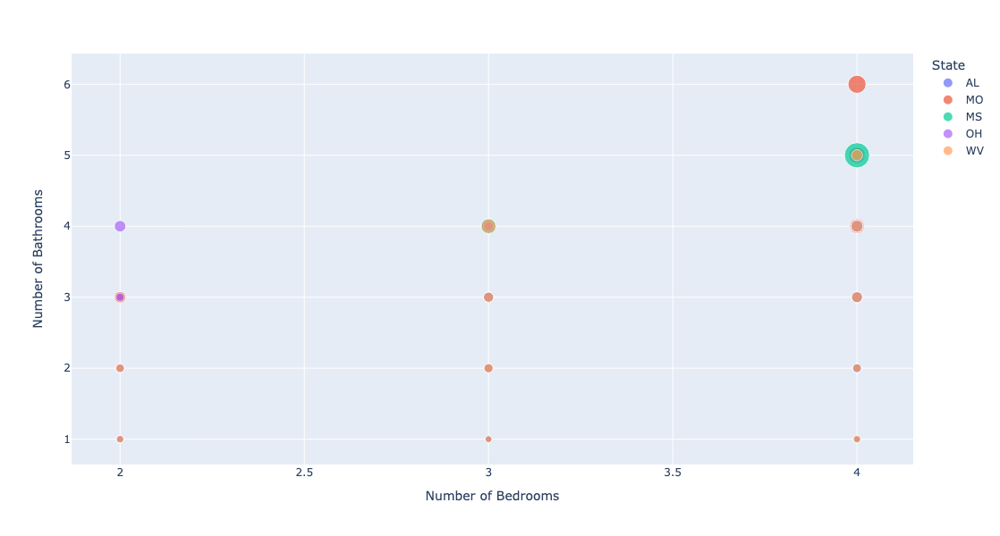

In [442]:
#Plotly
fig = px.scatter(averages_top_six_df, x="Bedroom", y = 'Bathroom',
                color = 'State', size= "Price", hover_data=["State"], labels={"Bedroom":"Number of Bedrooms",
                                                                        "Bathroom":"Number of Bathrooms"}, width=900, height=600)
#fig.update_layout(title="Attendance Rates vs MAP Scores by County - Free/Reduced Lunch Rates", title_x=0.45)
fig.show()

In [443]:
#MarketEstimate by Price
prices_df = home_reduced_df[["State", "MarketEstimate", "Price"]]

#Bottom States
bottom_five_df = prices_df.loc[(prices_df["State"]=="AL")| \
                                            (prices_df["State"]=="MO") | \
                                            (prices_df["State"]=="MS") | (prices_df["State"]=="OH") | \
                                            (prices_df["State"]=="WV")]

bottom_five_df = bottom_five_df[(bottom_five_df["Price"]>=500) & (bottom_five_df["Price"]<=2000001)]

bottom_five_df


,State,MarketEstimate,Price
0,AL,240600,239900
2,AL,336200,335000
3,AL,150500,151000
4,AL,238400,239000
5,AL,248000,249900
...,...,...,...
14336,WV,358800,375000
14337,WV,170700,180000
14338,WV,279000,280000
14339,WV,143700,154900


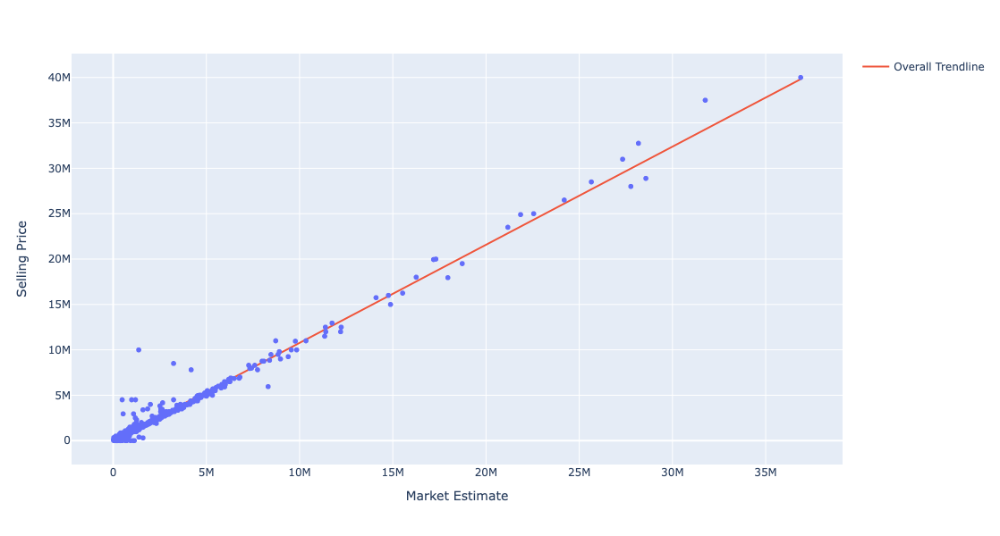

In [444]:
fig = px.scatter(prices_df, x="MarketEstimate", y = 'Price', trendline="ols", trendline_scope="overall", labels={"MarketEstimate":"Market Estimate",
                                                                        "Price":"Selling Price"},
                 width=900, height=600)
fig.show()

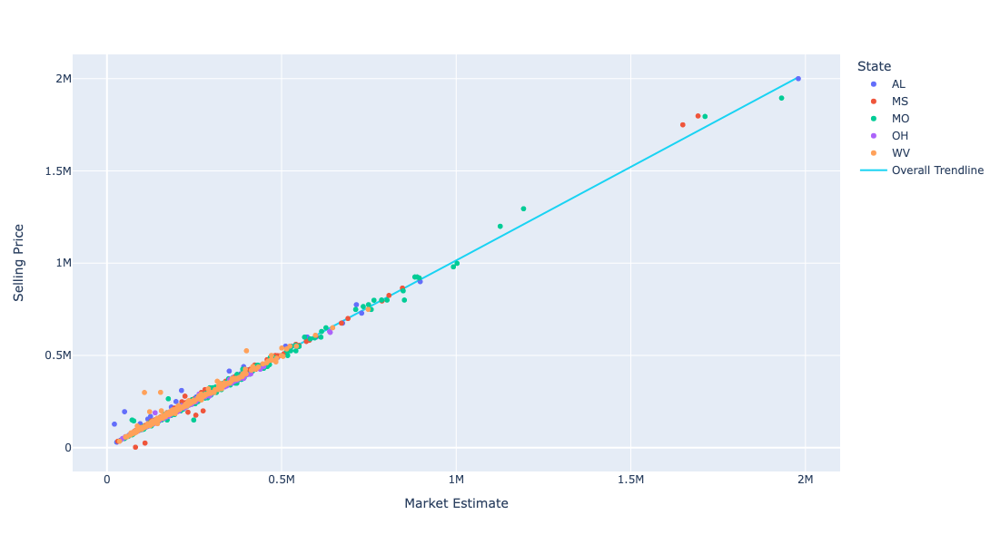

In [445]:
fig = px.scatter(bottom_five_df, x="MarketEstimate", y = 'Price', trendline="ols", trendline_scope="overall",
                color = 'State', hover_data=["State"], labels={"MarketEstimate":"Market Estimate",
                                                                        "Price":"Selling Price"},
                 width=900, height=600)
fig.show()

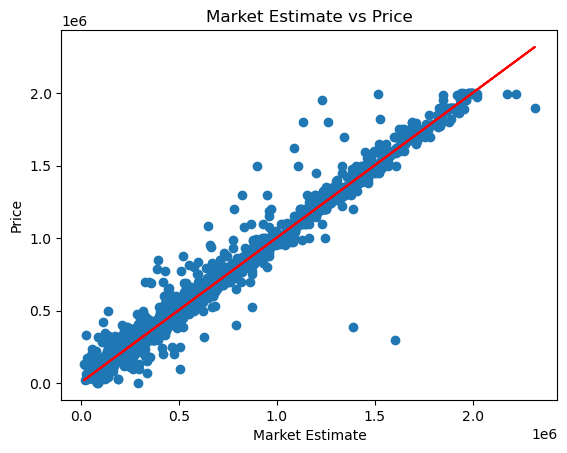

In [511]:
#Reduce Prices
prices_reduced_df = prices_df[(prices_df["Price"]>=500) & (prices_df["Price"]<=2000001)]

#Scatter Plot
x_values = prices_reduced_df["MarketEstimate"]
y_values = prices_reduced_df["Price"]
(slope, intercept, rvalue, pvalue, stderr) = linregress(x_values, y_values)
regress_values = x_values * slope + intercept
line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2))
plt.scatter(x_values,y_values)
plt.plot(x_values,regress_values,"r-")
plt.xlabel("Market Estimate")
plt.ylabel("Price")
plt.title("Market Estimate vs Price")
plt.savefig("Graphs/marketvsprice.png")
plt.show()

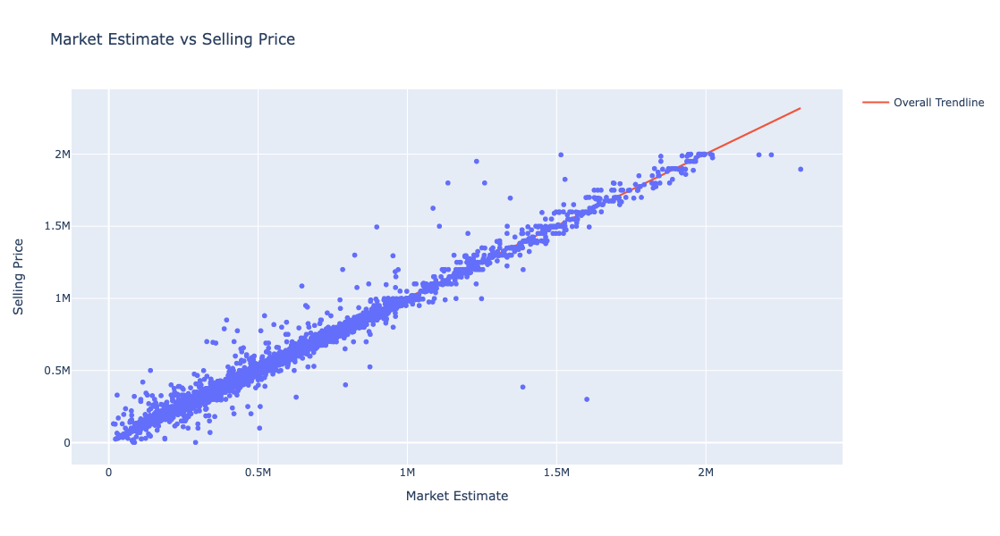

In [447]:
#Plotly Linear Regression
fig = px.scatter(prices_reduced_df, x="MarketEstimate", y = 'Price', trendline="ols", trendline_scope="overall", labels={"MarketEstimate":"Market Estimate",
                                                                        "Price":"Selling Price"}, title = "Market Estimate vs Selling Price", width=900, height=600)
fig.show()

/Users/jennifersavage/anaconda3/lib/python3.11/site-packages/seaborn/categorical.py:3399: UserWarning:

47.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.

/Users/jennifersavage/anaconda3/lib/python3.11/site-packages/seaborn/categorical.py:3399: UserWarning:

63.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.

/Users/jennifersavage/anaconda3/lib/python3.11/site-packages/seaborn/categorical.py:3399: UserWarning:

61.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.

/Users/jennifersavage/anaconda3/lib/python3.11/site-packages/seaborn/categorical.py:3399: UserWarning:

32.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.

/Users/jennifersavage/anaconda3/lib/python3.11/site-packages/seaborn/categorical.py:3399: UserWarning:

48.2% of the points cannot be placed; you may want to de

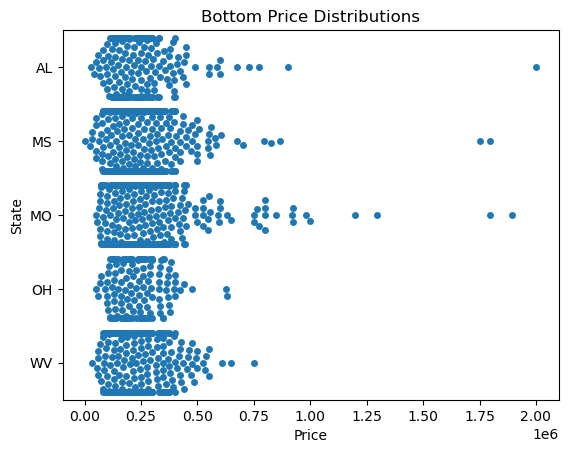

In [448]:
#Swarmplot
sns.swarmplot(data=bottom_five_df, x='Price', y='State')
plt.title('Bottom Price Distributions')
plt.show()

# Treemap by Region

In [449]:
#Rename Columns
regions_df = regions_df.rename(columns={"State":"State Name", "State Code":"State"})

regions_df

,State Name,State,Region,Division
0,Alaska,AK,West,Pacific
1,Alabama,AL,South,East South Central
2,Arkansas,AR,South,West South Central
3,Arizona,AZ,West,Mountain
4,California,CA,West,Pacific
5,Colorado,CO,West,Mountain
6,Connecticut,CT,Northeast,New England
7,District of Columbia,DC,South,South Atlantic
8,Delaware,DE,South,South Atlantic
9,Florida,FL,South,South Atlantic


In [450]:
#Merge and Filter
merged_df = pd.merge(home_df, regions_df, on = "State", how = "inner")

filtered_df = merged_df[["State", "Bedroom", "MarketEstimate", "Price", "Region", "Division", "State Name"]]

filtered_df

,State,Bedroom,MarketEstimate,Price,Region,Division,State Name
0,AL,4,240600,239900,South,East South Central,Alabama
1,AL,3,186700,1,South,East South Central,Alabama
2,AL,3,336200,335000,South,East South Central,Alabama
3,AL,3,150500,151000,South,East South Central,Alabama
4,AL,3,238400,239000,South,East South Central,Alabama
...,...,...,...,...,...,...,...
15023,WY,3,306700,310000,West,Mountain,Wyoming
15024,WY,3,184500,185000,West,Mountain,Wyoming
15025,WY,2,368600,375000,West,Mountain,Wyoming
15026,WY,3,558000,575900,West,Mountain,Wyoming


In [451]:
#Calculate Medians
medians_df = filtered_df.groupby(["State", "Bedroom", "Region", "Division", "State Name"])
price_df = medians_df["Price"].median()

#Make Data Frame and Reset Index
prices_medians_df = pd.DataFrame(price_df)
prices_medians_df = prices_medians_df.reset_index()

#Locate Bedroom numbers
three_bed_df = prices_medians_df.loc[prices_medians_df["Bedroom"]==3]

three_bed_df.head()

,State,Bedroom,Region,Division,State Name,Price
3,AK,3,West,Pacific,Alaska,389000.0
11,AL,3,South,East South Central,Alabama,219950.0
18,AR,3,South,West South Central,Arkansas,219950.0
26,AZ,3,West,Mountain,Arizona,395000.0
32,CA,3,West,Pacific,California,693250.0


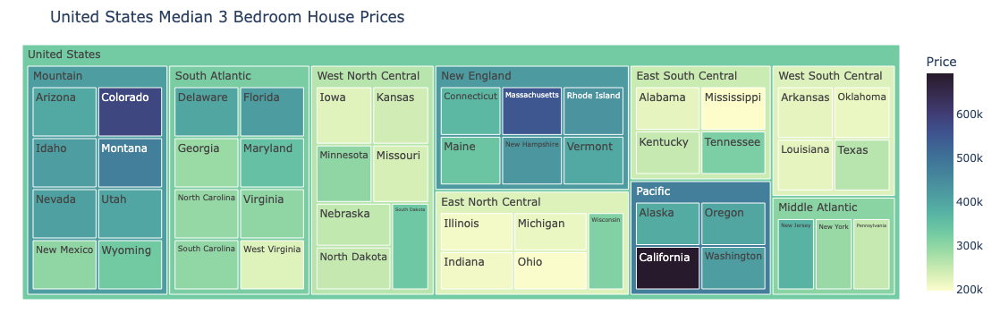

In [478]:
#Treemap by prices
fig = px.treemap(three_bed_df, path=[px.Constant("United States"), 'Division', 'State Name'],
                  color='Price', hover_data=['State'],
                  color_continuous_scale='deep', title="United States Median 3 Bedroom House Prices")
                  #color_continuous_midpoint=np.average(df['lifeExp'], weights=df['pop']))
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.write_image("Graphs/pricestreemap.png")
fig.show()

In [473]:
#Merge and Filter
merged_df = pd.merge(home_df, regions_df, on = "State", how = "inner")

filtered_2_df = merged_df[["State", "Area", "MarketEstimate", "Bedroom", "Price", "Region", "Division", "State Name"]]

filtered_2_df

,State,Area,MarketEstimate,Bedroom,Price,Region,Division,State Name
0,AL,1614,240600,4,239900,South,East South Central,Alabama
1,AL,1474,186700,3,1,South,East South Central,Alabama
2,AL,2224,336200,3,335000,South,East South Central,Alabama
3,AL,1564,150500,3,151000,South,East South Central,Alabama
4,AL,1717,238400,3,239000,South,East South Central,Alabama
...,...,...,...,...,...,...,...,...
15023,WY,2316,306700,3,310000,West,Mountain,Wyoming
15024,WY,2400,184500,3,185000,West,Mountain,Wyoming
15025,WY,1112,368600,2,375000,West,Mountain,Wyoming
15026,WY,2930,558000,3,575900,West,Mountain,Wyoming


In [475]:
#Calculate Medians
area_medians_df = filtered_2_df.groupby(["State", "Bedroom", "Region", "Division", "State Name"])
area_df = area_medians_df["Area"].median()

#Make Data Frame and Reset Index
area_medians_1_df = pd.DataFrame(area_df)
area_medians_1_df = area_medians_1_df.reset_index()

#Locate Bedroom numbers
three_area_df = area_medians_1_df.loc[area_medians_1_df["Bedroom"]==3]

three_area_df.head()

,State,Bedroom,Region,Division,State Name,Area
3,AK,3,West,Pacific,Alaska,1706.0
11,AL,3,South,East South Central,Alabama,1551.5
18,AR,3,South,West South Central,Arkansas,1673.5
26,AZ,3,West,Mountain,Arizona,1616.0
32,CA,3,West,Pacific,California,1584.0


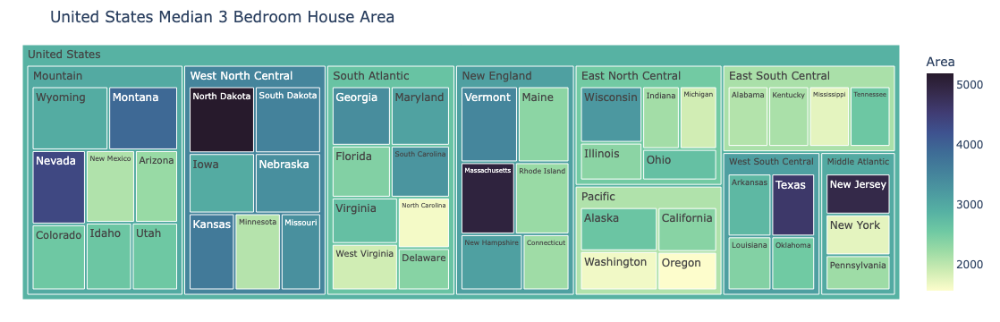

In [512]:
#Tree map by area
fig = px.treemap(area_medians_1_df, path=[px.Constant("United States"), 'Division', 'State Name'],
                  color='Area', hover_data=['State'],
                  color_continuous_scale='deep', title="United States Median 3 Bedroom House Area")
                  #color_continuous_midpoint=np.average(df['lifeExp'], weights=df['pop']))
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.write_image("Graphs/areatreemap.png")
fig.show()

# Map Attempt

In [453]:
zipcode_df = home_df[["State", "Zipcode", "Bedroom", "Price"]]
zipcode_3_df = zipcode_df.loc[zipcode_df["Bedroom"]==3]

zipcode_3_df

,State,Zipcode,Bedroom,Price
1,AL,35907,3,1
2,AL,35043,3,335000
3,AL,36117,3,151000
4,AL,35957,3,239000
5,AL,35950,3,249900
...,...,...,...,...
15019,WY,82001,3,330000
15023,WY,82633,3,310000
15024,WY,82501,3,185000
15026,WY,82009,3,575900


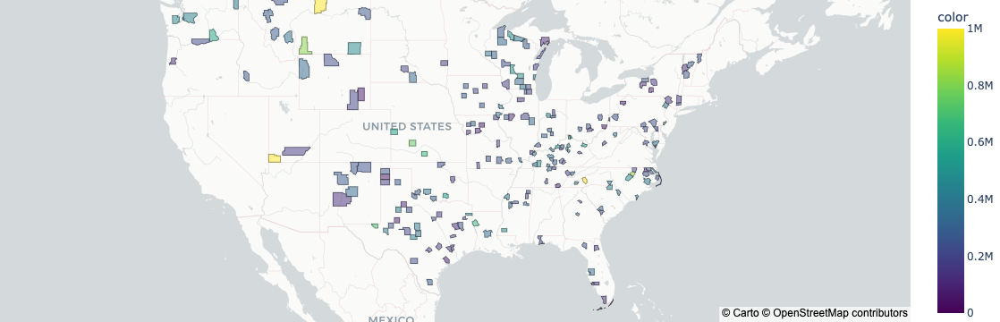

In [455]:
from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

import plotly.express as px

fig = px.choropleth_mapbox(geojson=counties, locations=zipcode_3_df['Zipcode'], color=zipcode_3_df['Price'],
                           color_continuous_scale="Viridis",
                           range_color=(0, 1000000),
                           mapbox_style="carto-positron",
                           zoom=3, center = {"lat": 37.0902, "lon": -95.7129},
                           opacity=0.5,
                           labels={'unemp':'unemployment rate'}
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

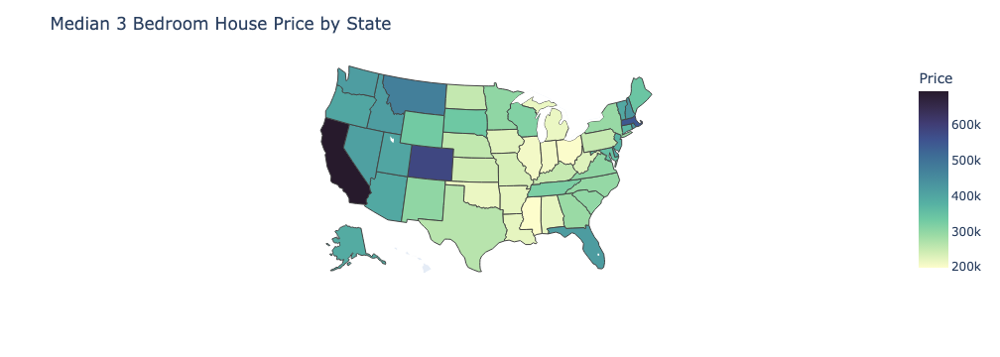

In [522]:
#Map by median house price

fig = px.choropleth(three_bed_state, locations="State", locationmode="USA-states", 
                    color="Price", scope="usa", 
                    color_continuous_scale="deep")
fig.update_layout(title="Median 3 Bedroom House Price by State")
fig.write_image("Graphs/pricemap.png")
fig.show()

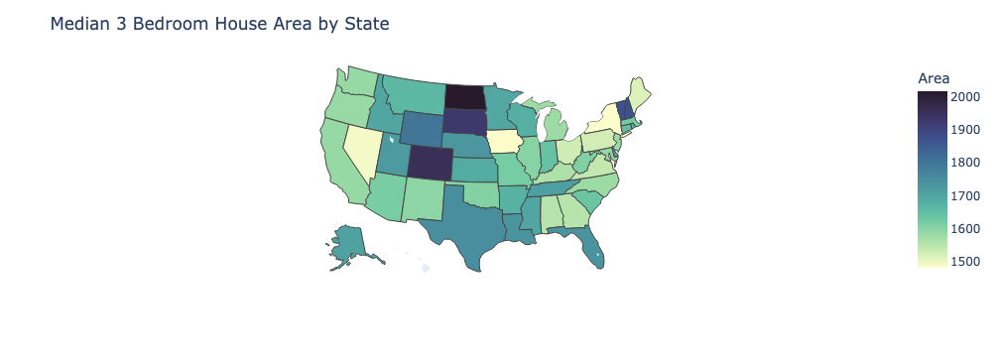

In [521]:
#Map by median area
fig = px.choropleth(three_bed_state, locations="State", locationmode="USA-states", 
                    color="Area", scope="usa", 
                    color_continuous_scale="deep")
fig.update_layout(title="Median 3 Bedroom House Area by State")
fig.write_image("Graphs/areamap.png")
fig.show()